[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/Denis-R-V/TSR/blob/main/1.Dataset_analysis.ipynb)

# Система распознавания дорожных знаков на датасете RTSD

## Анализ датасета

In [1]:
# путь к датасету
# если работаем в колабе - скачиваем и распаковываем датасет, ставим fiftyone

colab = False

if colab == True:
    from google.colab import drive
    drive.mount('/content/drive')
    !pip install kaggle
    !mkdir ~/.kaggle
    !cp /content/drive/MyDrive/kaggle.json ~/.kaggle/kaggle.json
    !kaggle datasets download watchman/rtsd-dataset
    !unzip rtsd-dataset.zip -d ./data/RTSD
    !rm rtsd-dataset.zip
    !cp -r data/RTSD/rtsd-frames/rtsd-frames/ data/RTSD/
    !rm -r data/RTSD/rtsd-frames/rtsd-frames/
    !pip install fiftyone

dataset_path = 'data/RTSD'

In [6]:
import json
import os

import fiftyone as fo
import pandas as pd 
from PIL import Image
from pycocotools.coco import COCO
import matplotlib.pyplot as plt
import matplotlib.patches as patches
%matplotlib inline

### файл *train_anno.json*

In [14]:
with open(os.path.join(dataset_path, 'train_anno.json'), 'r') as read_file:
    train_anno = json.load(read_file)
read_file.close()
print('Ключи в файле "train_anno.json"')
train_anno.keys()



Ключи в файле "train_anno.json"


dict_keys(['images', 'annotations', 'categories'])

In [20]:
print('Список "images". Длина:', len(train_anno.get('images')))
display(train_anno.get('images')[47])

print('Список "annotations". Длина:', len(train_anno.get('annotations')))
display(train_anno.get('annotations')[82])

print('Список "categories". Длина:', len(train_anno.get('categories')))
display(train_anno.get('categories')[10])

Список "images". Длина: 54188


{'id': 51,
 'width': 1280,
 'height': 720,
 'file_name': 'rtsd-frames/autosave01_02_2012_09_16_49.jpg'}

Список "annotations". Длина: 95492


{'id': 88,
 'image_id': 51,
 'category_id': 11,
 'area': 1813,
 'bbox': [826, 277, 37, 49],
 'iscrowd': 0}

Список "categories". Длина: 155


{'id': 11, 'name': '7_15'}

*archive/train_anno.json* состоит из 3 списков:
- *images* содержит информацию о 54188 изображениях (метаданные - id, ширина, высота и путь к файлу);
- *annotations* содержит информацию о 95492 аннотациях (ограничивающие прямоугольники, классы объектов и т.д.);
- *categories* содержит информацию о 155 категориях классификации.  
 
Датасет представлен в формате Common Objects in Context (COCO)

### файл *train_anno_reduced.json*

In [21]:
with open(os.path.join(dataset_path, 'train_anno_reduced.json'), 'r') as read_file:
    train_anno_reduced = json.load(read_file)
read_file.close()
print('Ключи в файле "train_anno_reduced.json"')
train_anno_reduced.keys()

Ключи в файле "train_anno_reduced.json"


dict_keys(['images', 'annotations', 'categories'])

In [38]:
print('Список "images". Длина:', len(train_anno_reduced.get('images')))
display(train_anno_reduced.get('images')[0])

print('Список "annotations". Длина:', len(train_anno_reduced.get('annotations')))
display(train_anno_reduced.get('annotations')[153])

print('Список "categories". Длина:', len(train_anno_reduced.get('categories')))
display(train_anno_reduced.get('categories')[10])

Список "images". Длина: 1889


{'id': 51,
 'width': 1280,
 'height': 720,
 'file_name': 'rtsd-frames/autosave01_02_2012_09_16_49.jpg'}

Список "annotations". Длина: 2325


{'id': 88,
 'image_id': 51,
 'category_id': 11,
 'area': 1813,
 'bbox': [826, 277, 37, 49],
 'iscrowd': 0}

Список "categories". Длина: 155


{'id': 11, 'name': '7_15'}

In [36]:
for j, i in enumerate(train_anno_reduced.get('annotations')):
    if i['image_id'] == 51:
        print(j)
    

153


In [39]:
# Проверим, что все пути изображений файла train_anno_reduced.json содержатся в файле train_anno.json
train_anno_images_set = []
for i in train_anno.get('images'):
    train_anno_images_set.append(i.get('file_name'))

train_anno_reduced_images_set = []
for i in train_anno_reduced.get('images'):
    train_anno_reduced_images_set.append(i.get('file_name'))

set(train_anno_images_set).issuperset(set(train_anno_reduced_images_set))

True

*train_anno_reduced.json* содержит подмножество *train_anno.json* (~3.5% изображений)

### файл *val_anno.json*

In [40]:
with open(os.path.join(dataset_path, 'val_anno.json'), 'r') as read_file:
    val_anno = json.load(read_file)
read_file.close()
print('Ключи в файле "val_anno.json"')
val_anno.keys()

Ключи в файле "val_anno.json"


dict_keys(['images', 'annotations', 'categories'])

In [41]:
print('Список "images". Длина:', len(val_anno.get('images')))
display(val_anno.get('images')[0])

print('Список "annotations". Длина:', len(val_anno.get('annotations')))
display(val_anno.get('annotations')[0])

print('Список "categories". Длина:', len(val_anno.get('categories')))
display(val_anno.get('categories')[2])

Список "images". Длина: 5000


{'id': 22978,
 'width': 1280,
 'height': 720,
 'file_name': 'rtsd-frames/autosave10_10_2012_13_50_36_1.jpg'}

Список "annotations". Длина: 8866


{'id': 37471,
 'image_id': 22978,
 'category_id': 3,
 'area': 810,
 'bbox': [622, 375, 30, 27],
 'iscrowd': 0}

Список "categories". Длина: 155


{'id': 3, 'name': '1_17'}

In [42]:
# Проверим, есть ли пересечания изображений, пути которых содержатся в файлах train_anno.json и val_anno.json
train_anno_images_set = []
for i in train_anno.get('images'):
    train_anno_images_set.append(i.get('file_name'))

val_anno_images_set = []
for i in val_anno.get('images'):
    val_anno_images_set.append(i.get('file_name'))

set(train_anno_images_set).isdisjoint(set(val_anno_images_set))

True

Множества изображений, пути которых содержатся в файлах *train_anno.json* и *val_anno.json* не пересекаются

### файл *label_map.json*

In [44]:
with open(os.path.join(dataset_path, 'label_map.json'), 'r') as read_file:
    label_map = json.load(read_file)
read_file.close()
label_map

{'2_1': 1,
 '1_23': 2,
 '1_17': 3,
 '3_24': 4,
 '8_2_1': 5,
 '5_20': 6,
 '5_19_1': 7,
 '5_16': 8,
 '3_25': 9,
 '6_16': 10,
 '7_15': 11,
 '2_2': 12,
 '2_4': 13,
 '8_13_1': 14,
 '4_2_1': 15,
 '1_20_3': 16,
 '1_25': 17,
 '3_4': 18,
 '8_3_2': 19,
 '3_4_1': 20,
 '4_1_6': 21,
 '4_2_3': 22,
 '4_1_1': 23,
 '1_33': 24,
 '5_15_5': 25,
 '3_27': 26,
 '1_15': 27,
 '4_1_2_1': 28,
 '6_3_1': 29,
 '8_1_1': 30,
 '6_7': 31,
 '5_15_3': 32,
 '7_3': 33,
 '1_19': 34,
 '6_4': 35,
 '8_1_4': 36,
 '8_8': 37,
 '1_16': 38,
 '1_11_1': 39,
 '6_6': 40,
 '5_15_1': 41,
 '7_2': 42,
 '5_15_2': 43,
 '7_12': 44,
 '3_18': 45,
 '5_6': 46,
 '5_5': 47,
 '7_4': 48,
 '4_1_2': 49,
 '8_2_2': 50,
 '7_11': 51,
 '1_22': 52,
 '1_27': 53,
 '2_3_2': 54,
 '5_15_2_2': 55,
 '1_8': 56,
 '3_13': 57,
 '2_3': 58,
 '8_3_3': 59,
 '2_3_3': 60,
 '7_7': 61,
 '1_11': 62,
 '8_13': 63,
 '1_12_2': 64,
 '1_20': 65,
 '1_12': 66,
 '3_32': 67,
 '2_5': 68,
 '3_1': 69,
 '4_8_2': 70,
 '3_20': 71,
 '3_2': 72,
 '2_3_6': 73,
 '5_22': 74,
 '5_18': 75,
 '2_3_5': 7

*label_map.json* содержит номера дорожных знаков (по ГОСТ) и соответствующие ему ID категорий в датасете

### файл *labels.txt*

In [47]:
with open(os.path.join(dataset_path, 'labels.txt'), 'r') as read_file:
    labels = read_file.read()
read_file.close()
print(labels)

2_1
1_23
1_17
3_24
8_2_1
5_20
5_19_1
5_16
3_25
6_16
7_15
2_2
2_4
8_13_1
4_2_1
1_20_3
1_25
3_4
8_3_2
3_4_1
4_1_6
4_2_3
4_1_1
1_33
5_15_5
3_27
1_15
4_1_2_1
6_3_1
8_1_1
6_7
5_15_3
7_3
1_19
6_4
8_1_4
8_8
1_16
1_11_1
6_6
5_15_1
7_2
5_15_2
7_12
3_18
5_6
5_5
7_4
4_1_2
8_2_2
7_11
1_22
1_27
2_3_2
5_15_2_2
1_8
3_13
2_3
8_3_3
2_3_3
7_7
1_11
8_13
1_12_2
1_20
1_12
3_32
2_5
3_1
4_8_2
3_20
3_2
2_3_6
5_22
5_18
2_3_5
7_5
8_4_1
3_14
1_2
1_20_2
4_1_4
7_6
8_1_3
8_3_1
4_3
4_1_5
8_2_3
8_2_4
1_31
3_10
4_2_2
7_1
3_28
4_1_3
5_4
5_3
6_8_2
3_31
6_2
1_21
3_21
1_13
1_14
2_3_4
4_8_3
6_15_2
2_6
3_18_2
4_1_2_2
1_7
3_19
1_18
2_7
8_5_4
5_15_7
5_14
5_21
1_1
6_15_1
8_6_4
8_15
4_5
3_11
8_18
8_4_4
3_30
5_7_1
5_7_2
1_5
3_29
6_15_3
5_12
3_16
1_30
5_11
1_6
8_6_2
6_8_3
3_12
3_33
8_4_3
5_8
8_14
8_17
3_6
1_26
8_5_2
6_8_1
5_17
1_10
8_16
7_18
7_14
8_23



Файл *archive/labels.txt* содержит список номеров дорожных знаков (по ГОСТ)

## Распределение дорожных знаков в выборках

In [48]:
# Проверим, что словари "id-номер" знака совпадают для разных выборок
for i in range(len(train_anno.get('categories'))):
    if (train_anno.get('categories')[i] == train_anno_reduced.get('categories')[i]) and \
    (train_anno.get('categories')[i] == val_anno.get('categories')[i]):
        pass
    else:
        print(f'Элементы {i} выборок не совпадают')

In [49]:
labels_list = labels.split('\n')
labels_list

['2_1',
 '1_23',
 '1_17',
 '3_24',
 '8_2_1',
 '5_20',
 '5_19_1',
 '5_16',
 '3_25',
 '6_16',
 '7_15',
 '2_2',
 '2_4',
 '8_13_1',
 '4_2_1',
 '1_20_3',
 '1_25',
 '3_4',
 '8_3_2',
 '3_4_1',
 '4_1_6',
 '4_2_3',
 '4_1_1',
 '1_33',
 '5_15_5',
 '3_27',
 '1_15',
 '4_1_2_1',
 '6_3_1',
 '8_1_1',
 '6_7',
 '5_15_3',
 '7_3',
 '1_19',
 '6_4',
 '8_1_4',
 '8_8',
 '1_16',
 '1_11_1',
 '6_6',
 '5_15_1',
 '7_2',
 '5_15_2',
 '7_12',
 '3_18',
 '5_6',
 '5_5',
 '7_4',
 '4_1_2',
 '8_2_2',
 '7_11',
 '1_22',
 '1_27',
 '2_3_2',
 '5_15_2_2',
 '1_8',
 '3_13',
 '2_3',
 '8_3_3',
 '2_3_3',
 '7_7',
 '1_11',
 '8_13',
 '1_12_2',
 '1_20',
 '1_12',
 '3_32',
 '2_5',
 '3_1',
 '4_8_2',
 '3_20',
 '3_2',
 '2_3_6',
 '5_22',
 '5_18',
 '2_3_5',
 '7_5',
 '8_4_1',
 '3_14',
 '1_2',
 '1_20_2',
 '4_1_4',
 '7_6',
 '8_1_3',
 '8_3_1',
 '4_3',
 '4_1_5',
 '8_2_3',
 '8_2_4',
 '1_31',
 '3_10',
 '4_2_2',
 '7_1',
 '3_28',
 '4_1_3',
 '5_4',
 '5_3',
 '6_8_2',
 '3_31',
 '6_2',
 '1_21',
 '3_21',
 '1_13',
 '1_14',
 '2_3_4',
 '4_8_3',
 '6_15_2',
 '2_6

In [50]:
category_ids = []
for i in train_anno.get('categories'):
    category_ids.append(i.get('id'))
category_ids

[1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155]

Обучающая выборка

In [51]:
train_signs_distribution_df = pd.DataFrame(train_anno.get('annotations'))
train_signs_distribution_df = train_signs_distribution_df.merge(pd.DataFrame([label_map]).T.reset_index().set_index(0),
                                                                left_on='category_id', right_index=True)
train_signs_distribution_df = train_signs_distribution_df['index'].value_counts().sort_index()
train_signs_distribution_df.name = 'count'
pd.DataFrame(train_signs_distribution_df).sort_values('count', ascending=False)

,count
index,
5_19_1,22147
2_1,10027
5_16,4727
5_15_2,4504
3_24,3761
...,...
8_16,3
8_3_3,2
4_5,2


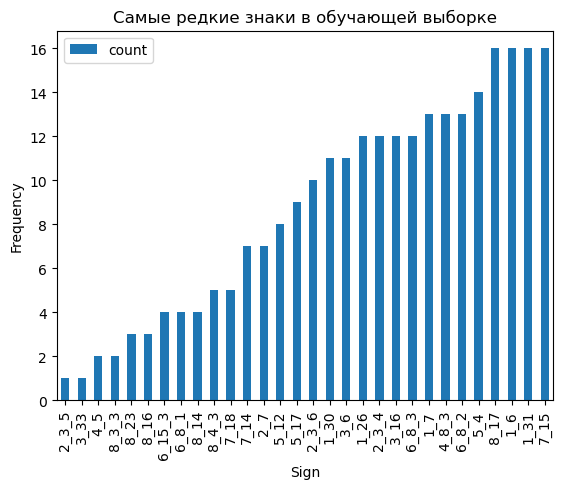

In [56]:
%matplotlib inline
smallest_class = pd.DataFrame(train_signs_distribution_df).sort_values('count')[:30]
# Столбчатая диаграмма
smallest_class.plot(kind='bar')
plt.xlabel("Sign")
plt.ylabel("Frequency")
plt.title("Самые редкие знаки в обучающей выборке")
plt.show()

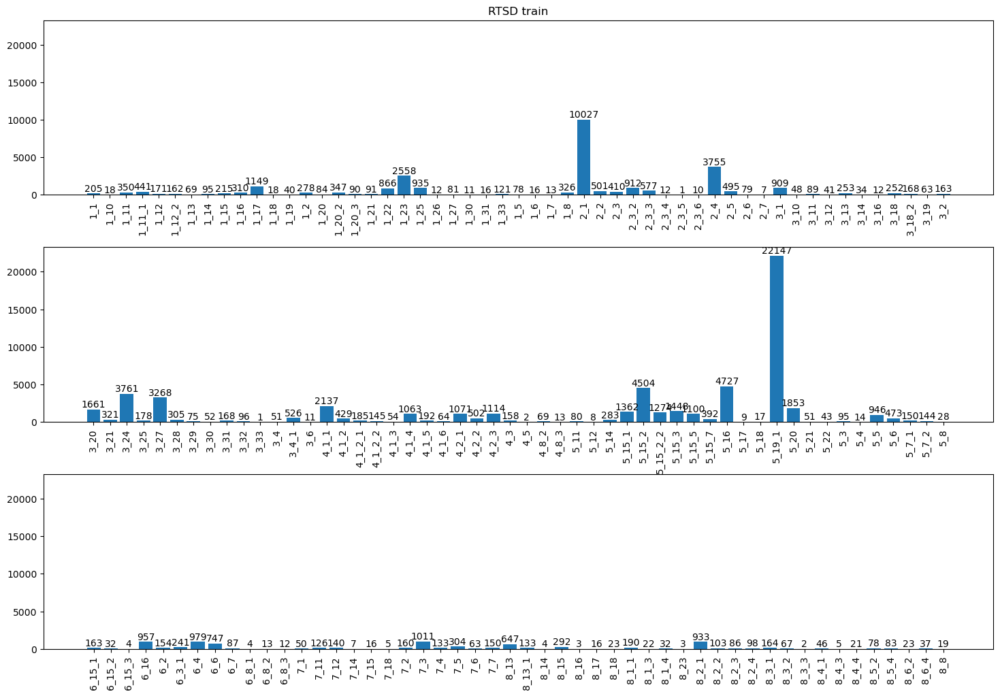

In [57]:
plot1 = train_signs_distribution_df[:53].copy()
plot2 = train_signs_distribution_df[53:105].copy()
plot3 = train_signs_distribution_df[105:].copy()
fig, ax = plt.subplots(nrows=3,ncols=1, sharey=True)
ax1, ax2, ax3 = ax.flatten()
bar1 = ax1.bar(plot1.index, plot1.values)
bar2 = ax2.bar(plot2.index, plot2.values)
bar3 = ax3.bar(plot3.index, plot3.values)
ax1.set_xticks(plot1.index, plot1.index, rotation=90)
ax2.set_xticks(plot2.index, plot2.index, rotation=90)
ax3.set_xticks(plot3.index, plot3.index, rotation=90)
ax1.bar_label(bar1)
ax2.bar_label(bar2)
ax3.bar_label(bar3)
ax1.set_title('RTSD train')
fig.set_size_inches(18,12)
plt.subplots_adjust(hspace=0.3)
plt.show()

Урезанная обучающая выборка

In [58]:
train_reduce_signs_distribution_df = pd.DataFrame(train_anno_reduced.get('annotations'))
train_reduce_signs_distribution_df = train_reduce_signs_distribution_df.merge(pd.DataFrame([label_map]).T.reset_index().set_index(0),
                                                                left_on='category_id', right_index=True)
train_reduce_signs_distribution_df = train_reduce_signs_distribution_df['index'].value_counts().sort_index()
train_reduce_signs_distribution_df.name = 'count'
pd.DataFrame(train_reduce_signs_distribution_df).sort_values('count', ascending=False)

,count
index,
1_1,15
6_15_2,15
5_4,15
5_5,15
5_6,15
...,...
3_2,15
3_20,15
3_21,15


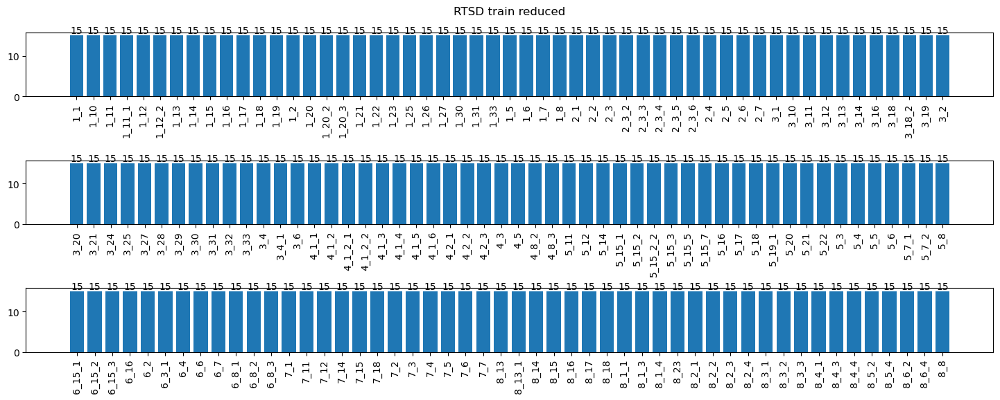

In [59]:
plot1 = train_reduce_signs_distribution_df[:53].copy()
plot2 = train_reduce_signs_distribution_df[53:105].copy()
plot3 = train_reduce_signs_distribution_df[105:].copy()
fig, ax = plt.subplots(nrows=3,ncols=1, sharey=True)
ax1, ax2, ax3 = ax.flatten()
bar1 = ax1.bar(plot1.index, plot1.values)
bar2 = ax2.bar(plot2.index, plot2.values)
bar3 = ax3.bar(plot3.index, plot3.values)
ax1.set_xticks(plot1.index, plot1.index, rotation=90)
ax2.set_xticks(plot2.index, plot2.index, rotation=90)
ax3.set_xticks(plot3.index, plot3.index, rotation=90)
ax1.bar_label(bar1)
ax2.bar_label(bar2)
ax3.bar_label(bar3)
ax1.set_title('RTSD train reduced\n')

fig.set_size_inches(18,6)
plt.subplots_adjust(hspace=1)
plt.show()

Тестовая выборка

In [60]:
val_signs_distribution_df = pd.DataFrame(val_anno.get('annotations'))
val_signs_distribution_df = val_signs_distribution_df.merge(pd.DataFrame([label_map]).T.reset_index().set_index(0),
                                                                left_on='category_id', right_index=True)
val_signs_distribution_df = val_signs_distribution_df['index'].value_counts().sort_index()
val_signs_distribution_df.name = 'count'
pd.DataFrame(val_signs_distribution_df).sort_values('count', ascending=False)

,count
index,
5_19_1,2117
2_1,934
5_16,445
5_15_2,440
3_24,343
...,...
5_12,1
5_17,1
6_8_1,1


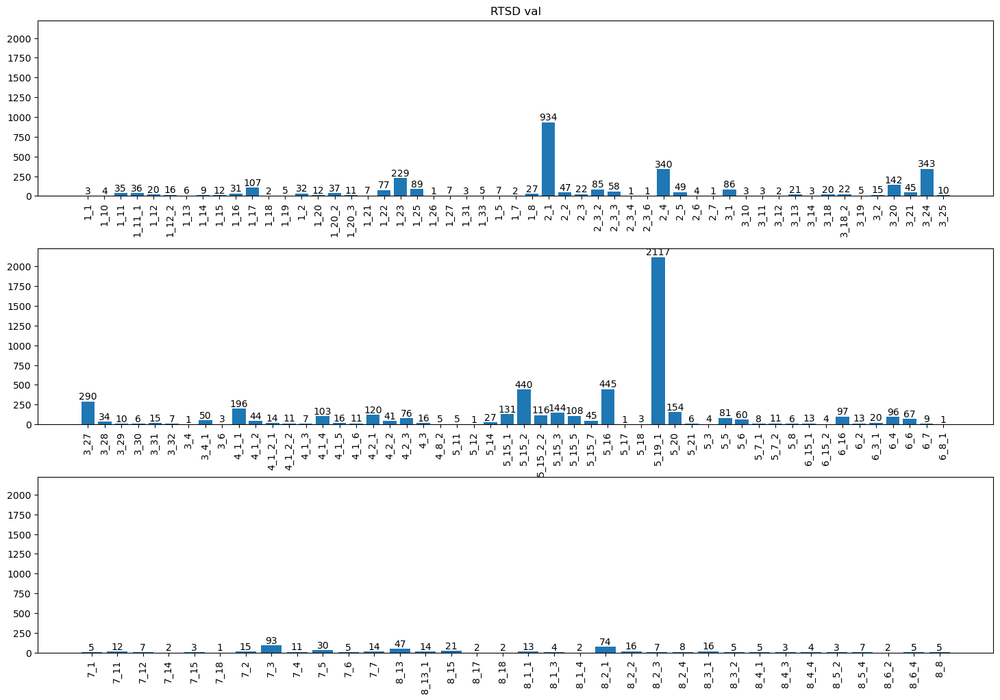

In [61]:
plot1 = val_signs_distribution_df[:53].copy()
plot2 = val_signs_distribution_df[53:105].copy()
plot3 = val_signs_distribution_df[105:].copy()
fig, ax = plt.subplots(nrows=3,ncols=1, sharey=True)
ax1, ax2, ax3 = ax.flatten()
bar1 = ax1.bar(plot1.index, plot1.values)
bar2 = ax2.bar(plot2.index, plot2.values)
bar3 = ax3.bar(plot3.index, plot3.values)
ax1.set_xticks(plot1.index, plot1.index, rotation=90)
ax2.set_xticks(plot2.index, plot2.index, rotation=90)
ax3.set_xticks(plot3.index, plot3.index, rotation=90)
ax1.bar_label(bar1)
ax2.bar_label(bar2)
ax3.bar_label(bar3)
ax1.set_title('RTSD val')
fig.set_size_inches(18,12)
plt.subplots_adjust(hspace=0.3)
plt.show()

In [62]:
signs_distribution = pd.DataFrame(train_signs_distribution_df).merge(pd.DataFrame(val_signs_distribution_df), left_index=True, right_index=True)
signs_distribution.rename(columns={'count_x': 'Train', 'count_y': 'Val'}, inplace=True)
signs_distribution

,Train,Val
index,,
1_1,205,3
1_10,18,4
1_11,350,35
1_11_1,441,36
1_12,171,20
...,...,...
8_5_2,78,3
8_5_4,83,7
8_6_2,23,2


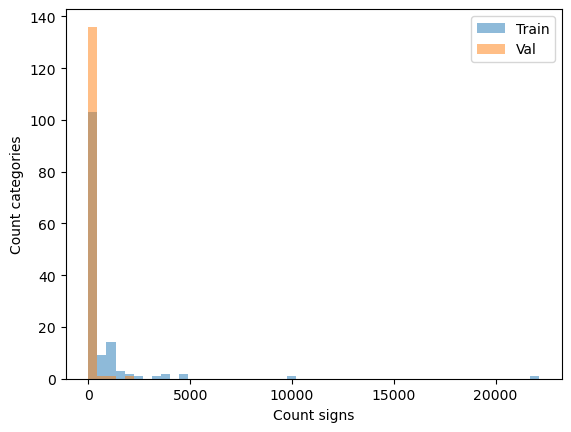

In [63]:
signs_distribution.plot.hist(alpha=0.5, label='Распределение частоты знаков', bins=50);
plt.xlabel("Count signs")
plt.ylabel("Count categories")
plt.show()

## Визуализация датасета с помощью библиотеки *pycocotools*

In [64]:
# загрузка аннотации
train_anno_file = os.path.join(dataset_path, 'train_anno.json')
train_anno_coco = COCO(train_anno_file)

loading annotations into memory...
Done (t=0.13s)
creating index...
index created!


In [65]:
# получение ID нужного знака
train_anno_coco.getCatIds(['5_19_1'])

[7]

In [66]:
# получение ID изображений, содержащих объект с указанным ID знака
train_anno_coco.getImgIds(catIds=[7])

[32768,
 32769,
 32770,
 32771,
 32772,
 32773,
 32774,
 32776,
 32777,
 32778,
 32779,
 17,
 18,
 19,
 20,
 31,
 32,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 32802,
 32803,
 32804,
 32805,
 32806,
 32807,
 32808,
 32809,
 32810,
 32811,
 32813,
 32814,
 56,
 57,
 58,
 64,
 65,
 66,
 67,
 68,
 71,
 72,
 73,
 74,
 75,
 76,
 79,
 80,
 81,
 87,
 88,
 89,
 90,
 32857,
 32859,
 32860,
 32861,
 32862,
 32863,
 32864,
 32865,
 32867,
 32868,
 101,
 102,
 32869,
 32873,
 32874,
 32875,
 32876,
 32877,
 32878,
 32879,
 32880,
 32881,
 32882,
 32883,
 32897,
 32899,
 32900,
 32901,
 32902,
 32903,
 32904,
 32905,
 32906,
 205,
 32975,
 208,
 209,
 210,
 32976,
 32977,
 32979,
 32980,
 32981,
 32982,
 32983,
 32991,
 32992,
 32993,
 32996,
 32997,
 32998,
 32999,
 33000,
 33001,
 33002,
 33003,
 33004,
 33005,
 33006,
 33007,
 33008,
 33009,
 33010,
 33011,
 33022,
 33023,
 33024,
 33025,
 33026,
 33027,
 33028,
 33029,
 33030,
 33031,
 33032,
 33033,
 33034,
 33035,
 33036,
 33037,
 33038,
 33039,
 3

In [67]:
# получение ID аннотаций для указанного ID изображения
annotation_ids = train_anno_coco.getAnnIds(imgIds=24666)
annotation_ids

[41142, 41143, 41144, 41145, 41146, 41147, 41148]

In [68]:
# получение ID аннотаций для указанных ID изображения и ID категории
annotation_ids = train_anno_coco.getAnnIds(imgIds=24666, catIds=[7])
annotation_ids

[41143, 41144, 41145, 41146, 41147]

In [69]:
# просмотр аннотации
train_anno_coco.anns[71808]

{'id': 71808,
 'image_id': 38918,
 'category_id': 7,
 'area': 5124,
 'bbox': [1054, 147, 61, 84],
 'iscrowd': 0}

In [70]:
def pycocotools_visualizer(image_id, category_id = None):
    '''функция по выводу изображения с указанным ID
    и визуализацией аннотаций с выбранными ID категорий (список)
    Если ID категорий не указаны - выводятся все аннотации для изображения'''
    if category_id:
        annotation_ids = train_anno_coco.getAnnIds(imgIds=image_id, catIds=category_id)
    else:
        annotation_ids = train_anno_coco.getAnnIds(imgIds=image_id)
            
    # загрузка аннотаций в список
    anns = train_anno_coco.loadAnns(annotation_ids)

    # путь к изображению и его название
    images_path = dataset_path
    image_name = train_anno_coco.loadImgs(image_id)[0].get('file_name')
    image = Image.open(os.path.join(images_path, image_name))
    
    fig, ax = plt.subplots()
    fig.set_size_inches(18, 10)
    
    # Draw boxes and add label to each box
    for ann in anns:
        box = ann['bbox']
        bb = patches.Rectangle((box[0],box[1]), box[2],box[3], linewidth=1, edgecolor="yellow", facecolor="none")
        ax.add_patch(bb)
    
    ax.imshow(image)
    plt.show()

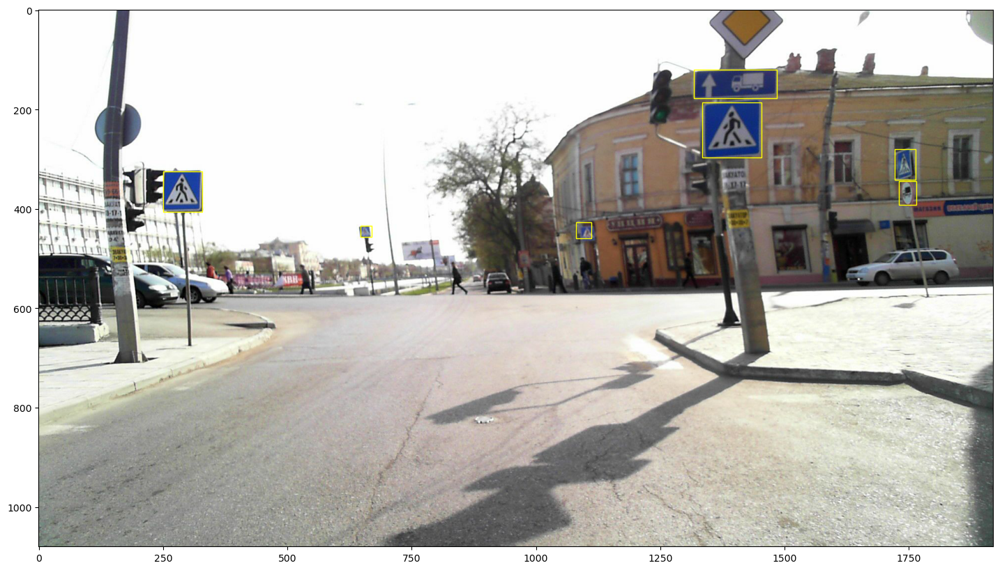

In [71]:
# вывод изображения и рамок для всех знаков
pycocotools_visualizer(24666)

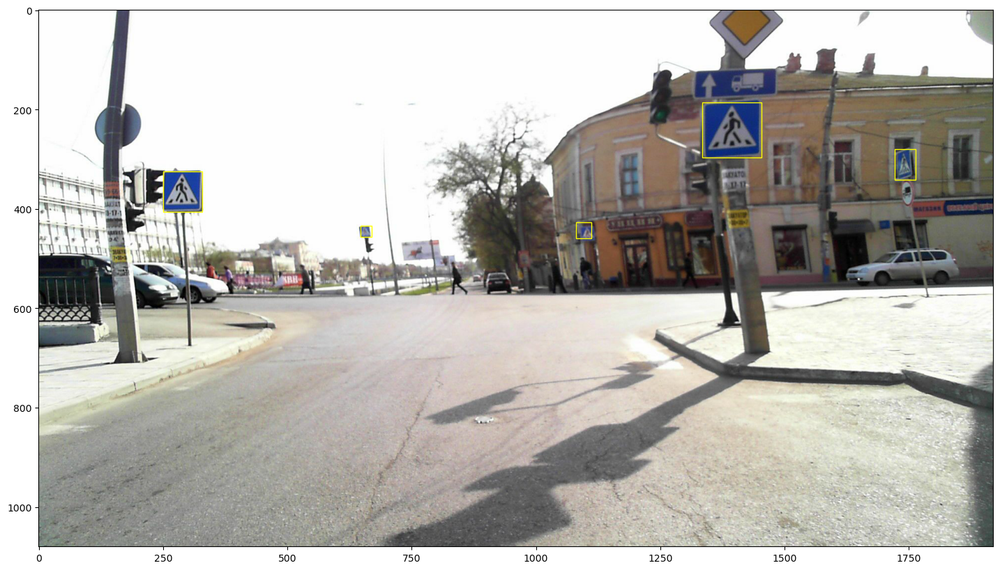

In [72]:
# вывод изображения и рамок для выбранных знаков
pycocotools_visualizer(24666, [7])

## Визуализация датасета с помощью библиотеки *fiftyone*

In [73]:
# загрузка датасета

# The directiry containing the source images
data_path = dataset_path      # можно не указывать, если в JSON путь совпадает

# The path yo the COCO labels JSON file
labels_file = "train_anno.json"
labels_path = os.path.join(dataset_path, labels_file)


# Import the dataset
dataset = fo.Dataset.from_dir(
    dataset_type=fo.types.COCODetectionDataset,
    data_path=data_path,
    labels_path=labels_path
)

 100% |█████████████| 54188/54188 [42.5s elapsed, 0s remaining, 1.4K samples/s]      


In [74]:
dataset

Name:        2024.01.21.23.52.11
Media type:  image
Num samples: 54188
Persistent:  False
Tags:        []
Sample fields:
    id:         fiftyone.core.fields.ObjectIdField
    filepath:   fiftyone.core.fields.StringField
    tags:       fiftyone.core.fields.ListField(fiftyone.core.fields.StringField)
    metadata:   fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.metadata.ImageMetadata)
    detections: fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.labels.Detections)

In [75]:
# Визуализация набора данных
session = fo.launch_app(dataset)

In [ ]:
# Использование агрегатов с помощью API для получения статистики о наборе данных
# Количество обнаружений для каждой категории
dataset.count_values("detections.detections.label")

{'6_16': 957,
 '8_8': 19,
 '3_11': 89,
 '5_15_3': 1448,
 '1_27': 81,
 '6_4': 979,
 '3_25': 178,
 '1_12_2': 162,
 '1_13': 69,
 '8_1_4': 32,
 '5_15_2': 4504,
 '3_13': 253,
 '8_2_2': 103,
 '8_4_1': 46,
 '6_15_1': 163,
 '1_20_3': 90,
 '8_13': 647,
 '5_12': 8,
 '3_6': 11,
 '5_6': 473,
 '5_22': 43,
 '1_26': 12,
 '5_17': 9,
 '3_18_2': 168,
 '4_2_1': 1071,
 '3_20': 1661,
 '2_3_3': 577,
 '1_20_2': 347,
 '1_2': 278,
 '5_18': 17,
 '6_6': 747,
 '1_14': 95,
 '2_6': 79,
 '8_13_1': 133,
 '1_1': 205,
 '8_6_4': 37,
 '3_2': 163,
 '4_5': 2,
 '3_33': 1,
 '8_4_3': 5,
 '3_4': 51,
 '3_18': 252,
 '5_15_2_2': 1274,
 '3_1': 909,
 '2_3_6': 10,
 '3_31': 168,
 '7_7': 150,
 '2_3_2': 912,
 '8_3_3': 2,
 '8_16': 3,
 '5_14': 283,
 '5_21': 51,
 '8_15': 292,
 '7_11': 126,
 '1_30': 11,
 '8_3_1': 164,
 '1_20': 84,
 '3_14': 34,
 '5_4': 14,
 '4_8_3': 13,
 '8_2_3': 86,
 '3_4_1': 526,
 '1_11_1': 441,
 '4_2_2': 502,
 '5_19_1': 22147,
 '3_24': 3761,
 '3_28': 305,
 '8_23': 3,
 '8_4_4': 21,
 '4_1_6': 64,
 '5_7_1': 150,
 '1_18': 18


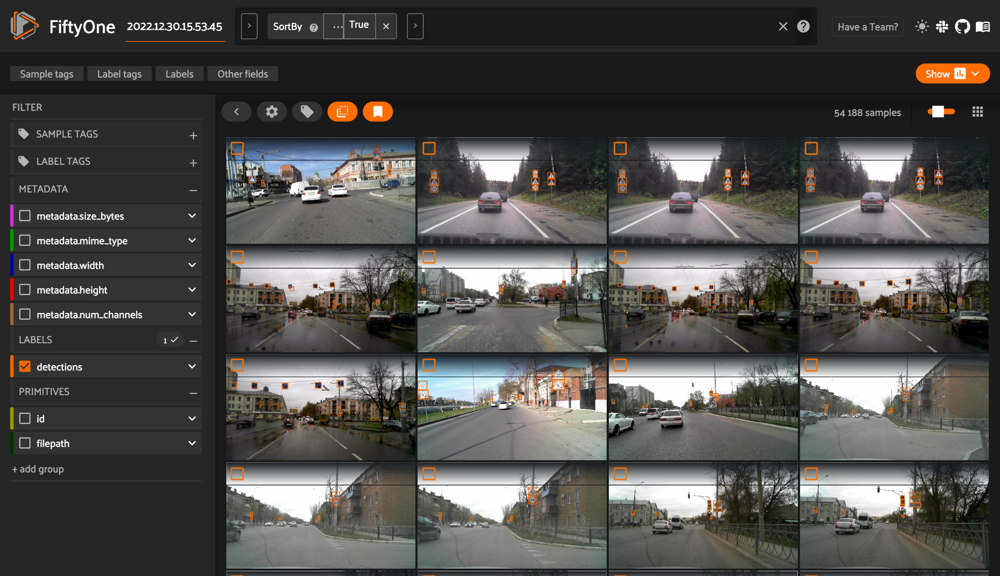

In [ ]:
# взаимодействие с набором данных через представление
# сортировка по выборкам с наибольшим количеством объектов
from fiftyone import ViewField as F

# Sort samples with the most objects first
obj_count_view = dataset.sort_by(F("detections.detections").length(), reverse=True)
session.view = obj_count_view


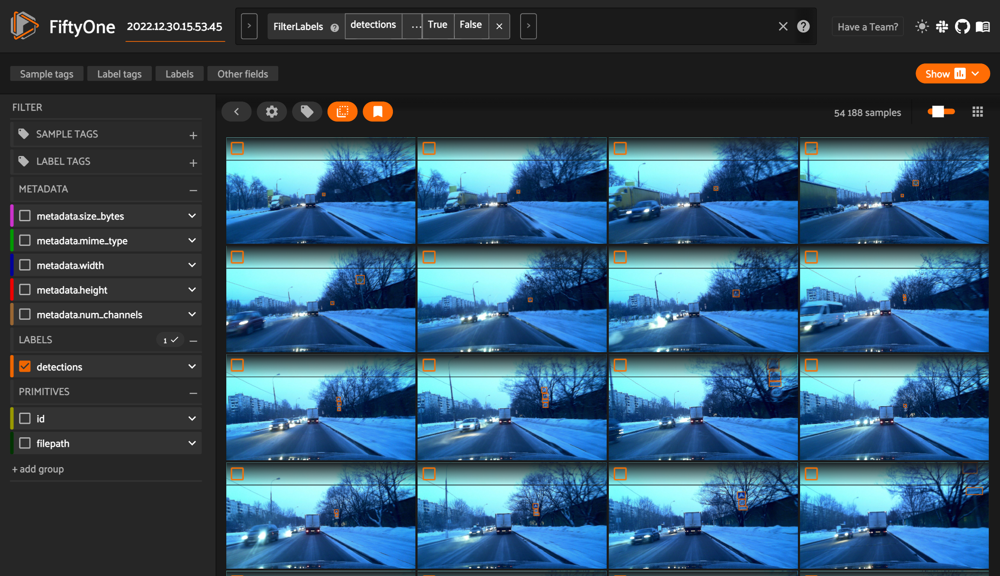

In [ ]:
# представление, которое фильтрует поле метки на основе более сложного значения, такого как небольшая область ограничивающей рамки

# Filter to only view small objects
# Bboxes are in [top-left-x, top-left-y, width, height] format
bbox_area = F("bounding_box")[2] * F("bounding_box")[3]

small_obj_view = dataset.filter_labels("detections",
                                       bbox_area < 0.5,
                                       )
session.view = small_obj_view

In [ ]:
# FiftyOne Brain содержит различные методы, позволяющие анализировать качество ваших достоверных данных.
# Например, можно найти самые уникальные образцы в своем наборе данных, которые помогут лучше понять,
# какие дополнительные данные вам следует добавить
import fiftyone.brain as fob
fob.compute_uniqueness(dataset)

 100% |████|  100.6Mb/100.6Mb [58.7s elapsed, 0s remaining, 2.1Mb/s]       
Computing embeddings...
 100% |█████████████| 54188/54188 [18.8m elapsed, 0s remaining, 48.7 samples/s]      
Computing uniqueness...
Computing neighbors for 54188 embeddings; this may take awhile...
Uniqueness computation complete



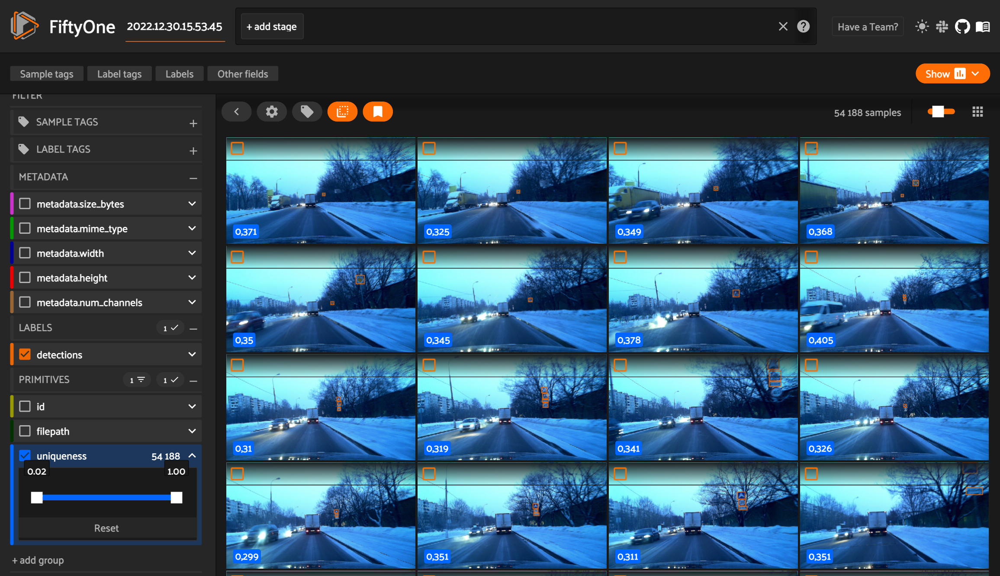


Could not connect session, trying again in 10 seconds


Could not connect session, trying again in 10 seconds



In [ ]:
session = fo.launch_app(dataset)

In [ ]:
fo.config.requirement_error_level=1

In [ ]:
fiftyone.config.requirement_error_level

In [ ]:
fo.zoo.models.install_zoo_model_requirements("ssd-mobilenet-v1-fpn-coco-tf", error_level=None)

In [ ]:
!pip install fiftyone zoo models list

  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... error
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> [8 lines of output]
      Traceback (most recent call last):
        File "<string>", line 2, in <module>
        File "<pip-setuptools-caller>", line 34, in <module>
        File "/private/var/folders/gh/31h0x0ms74xf16jg_0_6x8940000gn/T/pip-install-njgyctz9/models_d1a670afbba142a08c4364443da65154/setup.py", line 25, in <module>
          import models
        File "/private/var/folders/gh/31h0x0ms74xf16jg_0_6x8940000gn/T/pip-install-njgyctz9/models_d1a670afbba142a08c4364443da65154/models/__init__.py", line 23, in <module>
          from base import *
      ModuleNotFoundError: No module named 'base'
      [end of output]
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
error: metadata-generation-failed

× Encountered error while generating packag

In [ ]:
!eta install models

Cloning https://github.com/voxel51/models
Клонирование в «/opt/anaconda3/envs/ds_env/lib/python3.10/site-packages/eta/tensorflow/models»...
remote: Enumerating objects: 30876, done.
^Cлучение объектов:  16% (4964/30876), 19.80 МиБ | 216.00 КиБ/с
fetch-pack: unexpected disconnect while reading sideband packet
Traceback (most recent call last):
  File "/opt/anaconda3/envs/ds_env/bin/eta", line 8, in <module>
    sys.exit(main())
  File "/opt/anaconda3/envs/ds_env/lib/python3.10/site-packages/eta/core/cli.py", line 4262, in main
    args.execute(args)
  File "/opt/anaconda3/envs/ds_env/lib/python3.10/site-packages/eta/core/cli.py", line 4245, in <lambda>
    parser.set_defaults(execute=lambda args: command.execute(parser, args))
  File "/opt/anaconda3/envs/ds_env/lib/python3.10/site-packages/eta/core/cli.py", line 176, in execute
    _run_install_script(name, _INSTALL_SCRIPTS)
  File "/opt/anaconda3/envs/ds_env/lib/python3.10/site-packages/eta/core/cli.py", line 181, in _run_install_scrip

In [ ]:
# генерация прогнозов на предварительно обученных моделях с помощью FiftyOne Model Zoo
#import fiftyone as fo
import fiftyone.zoo as foz
#from object_detection.utils import label_map_util

# Load COCO dataset from disk
#dataset = fo.Dataset(
#    "/path/to/dataset_dir", 
#    dataset_type=fo.types.COCODetectionDataset, 
#    name="my_dataset"
#)

# Load a model and generate predictions
model = foz.load_zoo_model("ssd-mobilenet-v1-fpn-coco-tf", install_requirements=True)
dataset.apply_model(model, label_field="predictions")

# Launch the FiftyOne App to view dataset
session = fo.launch_app(dataset)

ImportError: You must run `eta install models` in order to use this model

In [ ]:
# Предсказание на предобученной моделе
import fiftyone as fo
import fiftyone.zoo as foz

# List available zoo models
model_names = foz.list_zoo_models()
print(model_names)

#
# Load zoo model
#
# This will download the model from the web, if necessary, and ensure
# that any required packages are installed
#
model = foz.load_zoo_model("faster-rcnn-resnet50-fpn-coco-torch")

#
# Load some samples from the COCO-2017 validation split
#
# This will download the dataset from the web, if necessary
#
#dataset = foz.load_zoo_dataset(
#    "coco-2017",
#    split="validation",
#    dataset_name="coco-2017-validation-sample",
#    max_samples=50,
#    shuffle=True,
#)

#
# Choose some samples to process. This can be the entire dataset, or a
# subset of the dataset. In this case, we'll choose some samples at
# random
#
samples = dataset.take(25)

#
# Generate predictions for each sample and store the results in the
# `faster_rcnn` field of the dataset, discarding all predictions with
# confidence below 0.5
#
samples.apply_model(model, label_field="faster_rcnn", confidence_thresh=0.5)
print(samples)

# Visualize predictions in the App
session = fo.launch_app(view=samples)

['alexnet-imagenet-torch', 'centernet-hg104-1024-coco-tf2', 'centernet-hg104-512-coco-tf2', 'centernet-mobilenet-v2-fpn-512-coco-tf2', 'centernet-resnet101-v1-fpn-512-coco-tf2', 'centernet-resnet50-v1-fpn-512-coco-tf2', 'centernet-resnet50-v2-512-coco-tf2', 'clip-vit-base32-torch', 'deeplabv3-cityscapes-tf', 'deeplabv3-mnv2-cityscapes-tf', 'deeplabv3-resnet101-coco-torch', 'deeplabv3-resnet50-coco-torch', 'densenet121-imagenet-torch', 'densenet161-imagenet-torch', 'densenet169-imagenet-torch', 'densenet201-imagenet-torch', 'efficientdet-d0-512-coco-tf2', 'efficientdet-d0-coco-tf1', 'efficientdet-d1-640-coco-tf2', 'efficientdet-d1-coco-tf1', 'efficientdet-d2-768-coco-tf2', 'efficientdet-d2-coco-tf1', 'efficientdet-d3-896-coco-tf2', 'efficientdet-d3-coco-tf1', 'efficientdet-d4-1024-coco-tf2', 'efficientdet-d4-coco-tf1', 'efficientdet-d5-1280-coco-tf2', 'efficientdet-d5-coco-tf1', 'efficientdet-d6-1280-coco-tf2', 'efficientdet-d6-coco-tf1', 'efficientdet-d7-1536-coco-tf2', 'faster-rcnn-in

/opt/anaconda3/envs/ds_env/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/anaconda3/envs/ds_env/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /Users/denis/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth


  0%|          | 0.00/160M [00:00<?, ?B/s]

 100% |███████████████████| 25/25 [1.6m elapsed, 0s remaining, 0.2 samples/s]     
Dataset:     2022.12.30.15.53.45
Media type:  image
Num samples: 25
Sample fields:
    id:          fiftyone.core.fields.ObjectIdField
    filepath:    fiftyone.core.fields.StringField
    tags:        fiftyone.core.fields.ListField(fiftyone.core.fields.StringField)
    metadata:    fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.metadata.ImageMetadata)
    detections:  fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.labels.Detections)
    uniqueness:  fiftyone.core.fields.FloatField
    faster_rcnn: fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.labels.Detections)
View stages:
    1. Take(size=25, seed=None)



Could not connect session, trying again in 10 seconds


Could not connect session, trying again in 10 seconds


Could not connect session, trying again in 10 seconds



In [ ]:
# Оценка модели mAP (средняя средняя точность)
# При оценке модели обнаружения объектов категории прогнозов должны совпадать с категориями набора данных
import fiftyone as fo

# Load a FiftyOne dataset you previously created
#dataset = fo.load_dataset("my_dataset")

results = dataset.evaluate_detections(
    pred_field="faster_rcnn", # predictions
    gt_field="detections",
    eval_key="eval_coco",
    compute_mAP=True,
)

print(results.mAP())

Evaluating detections...
 100% |█████████████| 54188/54188 [1.5m elapsed, 0s remaining, 703.8 samples/s]      
Performing IoU sweep...
 100% |█████████████| 54188/54188 [1.2m elapsed, 0s remaining, 848.8 samples/s]      
0.0


In [ ]:
from fiftyone import ViewField as F

high_conf_fp_view = dataset.filter_labels(
    "predictions", 
    (F("eval_coco")=="fp") & (F("confidence") > 0.7)
)

session.view = high_conf_fp_view

In [ ]:
# Маппинг кодов знаков на названия знаков
labels_names_map = {}
labels_names_map['1_1'] = 'Железнодорожный переезд со шлагбаумом'
labels_names_map['1_2'] = 'Железнодорожный переезд без шлагбаума'
labels_names_map['1_5'] = 'Пересечение с трамвайной линией'
labels_names_map['1_6'] = 'Пересечение равнозначных дорог'
labels_names_map['1_7'] = 'Пересечение с круговым движением'
labels_names_map['1_8'] = 'Светофорное регулирование'
labels_names_map['1_10'] = 'Выезд на набережную'
labels_names_map['1_11'] = 'Опасный поворот (направо)'
labels_names_map['1_11_1'] = 'Опасный поворот (налево)'
labels_names_map['1_12'] = 'Опасные повороты (первый направо)'
labels_names_map['1_12_2'] = 'Опасные повороты (первый налево)'
labels_names_map['1_13'] = 'Крутой спуск'
labels_names_map['1_14'] = 'Крутой подъём'
labels_names_map['1_15'] = 'Скользкая дорога'
labels_names_map['1_16'] = 'Неровная дорога'
labels_names_map['1_17'] = 'Искусственная неровность'
labels_names_map['1_18'] = 'Выброс гравия'
labels_names_map['1_19'] = 'Опасная обочина'
labels_names_map['1_20'] = 'Сужение дороги (с обеих сторон)'
labels_names_map['1_20_2'] = 'Сужение дороги (с правой стороны)'
labels_names_map['1_20_3'] = 'Сужение дороги (с левой стороны)'
labels_names_map['1_21'] = 'Двустороннее движение'
labels_names_map['1_22'] = 'Пешеходный переход'
labels_names_map['1_23'] = 'Дети'
labels_names_map['1_25'] = 'Дорожные работы'
labels_names_map['1_26'] = 'Перегон скота'
labels_names_map['1_27'] = 'Дикие животные'
labels_names_map['1_30'] = 'Низколетящие саолёты'
labels_names_map['1_31'] = 'Тоннель'
labels_names_map['1_33'] = 'Прочие опасности'
labels_names_map['2_1'] = 'Главная дорога'
labels_names_map['2_2'] = 'Конец главной дороги'
labels_names_map['2_3'] = 'Пересечение со второстепенной дорогой'
labels_names_map['2_3_2'] = 'Примыкание второстепенной дороги (справа)'
labels_names_map['2_3_3'] = 'Примыкание второстепенной дороги (слева)'
labels_names_map['2_3_4'] = 'Примыкание второстепенной дороги (справа)'
labels_names_map['2_3_5'] = 'Примыкание второстепенной дороги (слева)'
labels_names_map['2_3_6'] = 'Примыкание второстепенной дороги (справа)'
labels_names_map['2_4'] = 'Уступите дорогу'
labels_names_map['2_5'] = 'Движение без остановки запрещено'
labels_names_map['2_6'] = 'Преимущество встречного движения'
labels_names_map['2_7'] = 'Преимущество перед встречным движением'
labels_names_map['3_1'] = 'Въезд запрещён'
labels_names_map['3_2'] = 'Движение запрещено'
labels_names_map['3_4'] = 'Движение грузовых автомобилей запрещено (более указанной массы)'
labels_names_map['3_4_1'] = 'Движение грузовых автомобилей запрещено (более 3,5 т)'
labels_names_map['3_6'] = 'Движение тракторов запрещено'
labels_names_map['3_10'] = 'Движение пешеходов запрещено'
labels_names_map['3_11'] = 'Ограничение массы'
labels_names_map['3_12'] = 'Ограничение массы, приходящейся на ось транспортного средства'
labels_names_map['3_13'] = 'Ограничение высоты'
labels_names_map['3_14'] = 'Ограничение ширины'
labels_names_map['3_16'] = 'Ограничение минимальной дистанции'
labels_names_map['3_18'] = 'Поворот направо запрещён'
labels_names_map['3_18_2'] = 'Поворот налево запрещён'
labels_names_map['3_19'] = 'Разворот запрещён'
labels_names_map['3_20'] = 'Обгон запрещён'
labels_names_map['3_21'] = 'Конец зоны запрещения обгона'
labels_names_map['3_24'] = 'Ограничение максимальной скорости'
labels_names_map['3_25'] = 'Конец зоны ограничения максимальной скорости'
labels_names_map['3_27'] = 'Остановка запрещена'
labels_names_map['3_28'] = 'Стоянка запрещена'
labels_names_map['3_29'] = 'Стоянка запрещена по нечётным числам месяца'
labels_names_map['3_30'] = 'Стоянка запрещена по чётным числам месяца'
labels_names_map['3_31'] = 'Конец зоны всех ограничений'
labels_names_map['3_32'] = 'Движение транспортных средств с опасными грузами запрещено'
labels_names_map['3_33'] = 'Движение транспортных средств с взрывчатыми и легковоспламеняющимися грузами запрещено'
labels_names_map['4_1_1'] = 'Движение прямо'
labels_names_map['4_1_2'] = 'Движение направо'
labels_names_map['4_1_2_1'] = 'Движение направо (прямая стрелка)'
labels_names_map['4_1_2_2'] = 'Движение налево (прямая стрелка)'
labels_names_map['4_1_3'] = 'Движение налево'
labels_names_map['4_1_4'] = 'Движение прямо или направо'
labels_names_map['4_1_5'] = 'Движение прямо или налево'
labels_names_map['4_1_6'] = 'Движение направо или налево'
labels_names_map['4_2_1'] = 'Объезд препятствия справа'
labels_names_map['4_2_2'] = 'Объезд препятствия слева'
labels_names_map['4_2_3'] = 'Объезд препятствия справа или слева'
labels_names_map['4_3'] = 'Круговое движение'
labels_names_map['4_5'] = 'Пешеходная дорожка'
labels_names_map['4_8_2'] = 'Направление движения транспортных средств с опасными грузами (направо)'
labels_names_map['4_8_3'] = 'Направление движения транспортных средств с опасными грузами (налево)'
labels_names_map['5_3'] = 'Дорога для автомобилей'
labels_names_map['5_4'] = 'Конец дороги для автомобилей'
labels_names_map['5_5'] = 'Дорога с односторонним движением'
labels_names_map['5_6'] = 'Конец дороги с односторонним движением'
labels_names_map['5_7_1'] = 'Выезд на дорогу с односторонним движением (направо)'
labels_names_map['5_7_2'] = 'Выезд на дорогу с односторонним движением (налево)'
labels_names_map['5_8'] = 'Реверсивное движение'
labels_names_map['5_11'] = 'Дорога с полосой для маршрутных транспортных средств'
labels_names_map['5_12'] = 'Конец дороги с полосой для маршрутных транспортных средств'
labels_names_map['5_14'] = 'Полоса для маршрутных транспортных средств'
labels_names_map['5_15_1'] = 'Направления движения по полосам'
labels_names_map['5_15_2'] = 'Направления движения по полосе'
labels_names_map['5_15_2_2'] = 'Направления движения по полосе (в 2 полосы)'
labels_names_map['5_15_3'] = 'Начало полосы'
labels_names_map['5_15_5'] = 'Конец полосы'
labels_names_map['5_15_7'] = 'Направление движения по полосе'
labels_names_map['5_16'] = 'Место остановки автобуса и (или) троллейбуса'
labels_names_map['5_17'] = 'Место остановки трамвая'
labels_names_map['5_18'] = 'Место стоянки легковых такси'
labels_names_map['5_19_1'] = 'Пешеходный переход'
labels_names_map['5_20'] = 'Искусственная неровность'
labels_names_map['5_21'] = 'Жилая зона'
labels_names_map['5_22'] = 'Конец жилой зоны'
labels_names_map['6_2'] = 'Рекомендуемая скорость'
labels_names_map['6_3_1'] = 'Место для разворота'
labels_names_map['6_4'] = 'Парковка (парковочное место)'
labels_names_map['6_6'] = 'Подземный пешеходный переход'
labels_names_map['6_7'] = 'Надземный пешеходный переход'
labels_names_map['6_8_1'] = 'Тупик (прямо)'
labels_names_map['6_8_2'] = 'Тупик (направо)'
labels_names_map['6_8_3'] = 'Тупик (налево)'
labels_names_map['6_15_1'] = 'Направление движения для грузовых автомобилей (прямо)'
labels_names_map['6_15_2'] = 'Направление движения для грузовых автомобилей (направо)'
labels_names_map['6_15_3'] = 'Направление движения для грузовых автомобилей (налево)'
labels_names_map['6_16'] = 'Стоп-линия'
labels_names_map['7_1'] = 'Пункт первой медицинской помощи'
labels_names_map['7_2'] = 'Больница'
labels_names_map['7_3'] = 'Автозаправочная станция'
labels_names_map['7_4'] = 'Техническое обслуживание автомобилей'
labels_names_map['7_5'] = 'Мойка автомобилей'
labels_names_map['7_6'] = 'Телефон'
labels_names_map['7_7'] = 'Пункт питания'
labels_names_map['7_11'] = 'Место отдыха'
labels_names_map['7_12'] = 'Пост ДПС'
labels_names_map['7_14'] = 'Пункт транспортного контроля'
labels_names_map['7_15'] = 'Зона приёма радиостанции, передающей информацию о дорожном движении'
labels_names_map['7_18'] = 'Туалет'
labels_names_map['8_1_1'] = 'Расстояние до объекта'
labels_names_map['8_1_3'] = 'Расстояние до объекта (в стороне от дороги справа)'
labels_names_map['8_1_4'] = 'Расстояние до объекта (в стороне от дороги слева)'
labels_names_map['8_2_1'] = 'Зона действия (протяженность)'
labels_names_map['8_2_2'] = 'Зона действия'
labels_names_map['8_2_3'] = 'Зона действия (конец зоны действия)'
labels_names_map['8_2_4'] = 'Зона действия (нахождение в зоне действия)'
labels_names_map['8_3_1'] = 'Направления действия (направо)'
labels_names_map['8_3_2'] = 'Направления действия (налево)'
labels_names_map['8_3_3'] = 'Направления действия (направо и налево)'
labels_names_map['8_4_1'] = 'Вид транспортного средства (грузовой автомобиль более 3,5 т)'
labels_names_map['8_4_3'] = 'Вид транспортного средства (легковой автомобиль)'
labels_names_map['8_4_4'] = 'Вид транспортного средства (автобус)'
labels_names_map['8_5_2'] = 'Рабочие дни'
labels_names_map['8_5_4'] = 'Время действия'
labels_names_map['8_6_2'] = 'Способ постановки транспортного средства на стоянку (в заездом на обочину)'
labels_names_map['8_6_4'] = 'Способ постановки транспортного средства на стоянку (перпендикулярно обочине)'
labels_names_map['8_8'] = 'Платные услуги'
labels_names_map['8_13'] = 'Направление главной дороги'
labels_names_map['8_13_1'] = 'Направление главной дороги (кольцо)'
labels_names_map['8_14'] = 'Полоса движения'
labels_names_map['8_15'] = 'Слепые пешеходы'
labels_names_map['8_16'] = 'Влажное покрытие'
labels_names_map['8_17'] = 'Инвалиды'
labels_names_map['8_18'] = 'Кроме инвалидов'
labels_names_map['8_23'] = 'Фотовидеофиксация'

#with open(os.path.join(dataset_path, 'labels_names_map.json'), 'w') as f:
#    json.dump(labels_names_map, f)#ensure_ascii=False, indent=4)
#f.close()

labels_names_map